# Library

In [1]:
# common library
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Stat Library
from statsmodels.tsa.stattools import adfuller

import warnings
warnings.filterwarnings("ignore")

# Dataset

## Train Data

In [2]:
train = pd.read_csv("D:/Semester 6\Data Panel/Tugas Akhir/train.csv")

In [3]:
train.head()

,time,temperature_2m_max (°C),temperature_2m_min (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),sunrise (iso8601),sunset (iso8601),shortwave_radiation_sum (MJ/m²),rain_sum (mm),snowfall_sum (cm),windspeed_10m_max (km/h),windgusts_10m_max (km/h),winddirection_10m_dominant (°),et0_fao_evapotranspiration (mm),elevation,city
0,2018-01-01,29.9,26.0,36.3,31.6,2018-01-01T05:15,2018-01-01T17:49,17.59,7.7,0.0,6.9,20.2,277.0,3.61,0,su
1,2018-01-02,30.6,25.7,37.7,31.2,2018-01-02T05:15,2018-01-02T17:50,19.87,9.4,0.0,7.1,18.0,168.0,4.11,0,su
2,2018-01-03,31.8,25.9,40.3,31.7,2018-01-03T05:16,2018-01-03T17:50,20.44,7.8,0.0,8.1,21.2,125.0,4.23,0,su
3,2018-01-04,30.8,26.0,39.1,31.6,2018-01-04T05:16,2018-01-04T17:50,20.44,29.7,0.0,7.2,21.6,190.0,4.22,0,su
4,2018-01-05,30.9,25.2,37.6,29.9,2018-01-05T05:17,2018-01-05T17:51,20.10,22.5,0.0,6.9,21.2,241.0,4.16,0,su


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13258 entries, 0 to 13257
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   time                             13258 non-null  object 
 1   temperature_2m_max (°C)          13208 non-null  float64
 2   temperature_2m_min (°C)          13208 non-null  float64
 3   apparent_temperature_max (°C)    13208 non-null  float64
 4   apparent_temperature_min (°C)    13208 non-null  float64
 5   sunrise (iso8601)                13258 non-null  object 
 6   sunset (iso8601)                 13258 non-null  object 
 7   shortwave_radiation_sum (MJ/m²)  13198 non-null  float64
 8   rain_sum (mm)                    13198 non-null  float64
 9   snowfall_sum (cm)                13198 non-null  float64
 10  windspeed_10m_max (km/h)         13208 non-null  float64
 11  windgusts_10m_max (km/h)         13208 non-null  float64
 12  winddirection_10m_

## Test Data

In [5]:
test = pd.read_csv('D:/Semester 6/Data Panel/Tugas Akhir/test.csv')

In [6]:
test.head()

,id,time,temperature_2m_max (°C),temperature_2m_min (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),sunrise (iso8601),sunset (iso8601),shortwave_radiation_sum (MJ/m²),snowfall_sum (cm),windspeed_10m_max (km/h),windgusts_10m_max (km/h),winddirection_10m_dominant (°),et0_fao_evapotranspiration (mm),elevation,city
0,0,2021-08-02,32.3,25.3,38.2,29.6,2021-08-02T05:39,2021-08-02T17:30,20.79,0.0,7.6,16.9,134.0,4.45,0,su
1,1,2021-08-03,31.7,25.5,37.4,30.3,2021-08-03T05:39,2021-08-03T17:30,20.01,0.0,10.2,21.6,131.0,4.32,0,su
2,2,2021-08-04,32.6,25.7,37.1,30.8,2021-08-04T05:39,2021-08-04T17:30,20.89,0.0,17.3,32.4,116.0,4.73,0,su
3,3,2021-08-05,32.0,25.7,36.8,31.1,2021-08-05T05:39,2021-08-05T17:30,22.19,0.0,15.8,29.2,115.0,4.96,0,su
4,4,2021-08-06,31.9,26.3,36.0,31.6,2021-08-06T05:38,2021-08-06T17:30,21.84,0.0,20.2,36.7,106.0,4.99,0,su


In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4972 entries, 0 to 4971
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               4972 non-null   int64  
 1   time                             4972 non-null   object 
 2   temperature_2m_max (°C)          4972 non-null   float64
 3   temperature_2m_min (°C)          4972 non-null   float64
 4   apparent_temperature_max (°C)    4972 non-null   float64
 5   apparent_temperature_min (°C)    4972 non-null   float64
 6   sunrise (iso8601)                4972 non-null   object 
 7   sunset (iso8601)                 4972 non-null   object 
 8   shortwave_radiation_sum (MJ/m²)  4972 non-null   float64
 9   snowfall_sum (cm)                4972 non-null   float64
 10  windspeed_10m_max (km/h)         4972 non-null   float64
 11  windgusts_10m_max (km/h)         4972 non-null   float64
 12  winddirection_10m_do

# Preprocessing

## Train

In [8]:
train.rename(
    columns = {
        'temperature_2m_max (°C)':'temp_max',
        'temperature_2m_min (°C)':'temp_min',
        'apparent_temperature_max (°C)':'app_temp_max',
        'apparent_temperature_min (°C)':'app_temp_min',
        'sunrise (iso8601)':'sunrise',
        'sunset (iso8601)':'sunset',
        'shortwave_radiation_sum (MJ/m²)':'srs',
        'rain_sum (mm)':'rain_sum',
        'snowfall_sum (cm)':'snowfall_sum',
        'windspeed_10m_max (km/h)':'ws_10m_max',
        'windgusts_10m_max (km/h)':'wg_10m_max',
        'winddirection_10m_dominant (°)':'wd_10m_dom',
        'et0_fao_evapotranspiration (mm)':'et0'
    }, inplace = True
)

<AxesSubplot: >

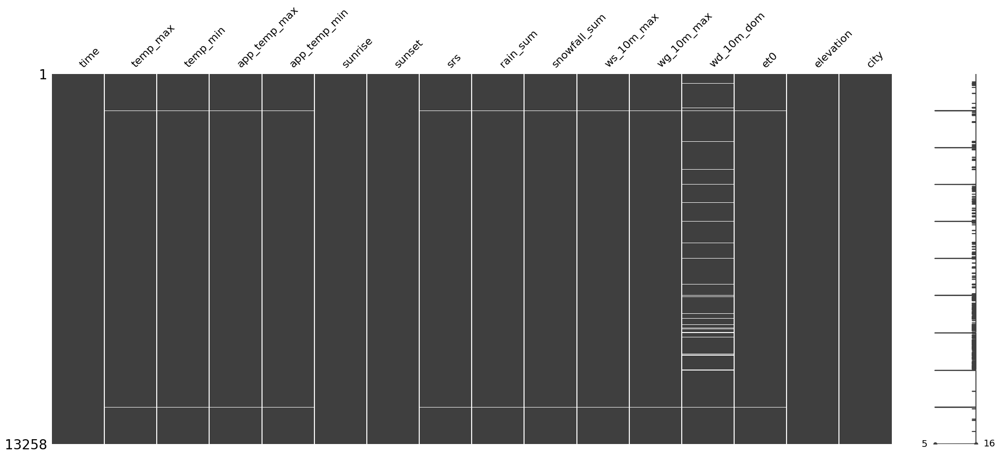

In [9]:
msno.matrix(train)

In [10]:
train.isnull().sum()

time              0
temp_max         50
temp_min         50
app_temp_max     50
app_temp_min     50
sunrise           0
sunset            0
srs              60
rain_sum         60
snowfall_sum     60
ws_10m_max       50
wg_10m_max       50
wd_10m_dom      466
et0              60
elevation         0
city              0
dtype: int64

In [11]:
train[train['rain_sum'].isnull()]

,time,temp_max,temp_min,app_temp_max,app_temp_min,sunrise,sunset,srs,rain_sum,snowfall_sum,ws_10m_max,wg_10m_max,wd_10m_dom,et0,elevation,city
1312,2022-12-23,26.5,25.6,30.8,29.5,2022-12-23T05:10,2022-12-23T17:45,NaN,NaN,NaN,14.9,27.4,NaN,NaN,0,su
1313,2022-12-24,NaN,NaN,NaN,NaN,2022-12-24T05:11,2022-12-24T17:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,su
1314,2022-12-25,NaN,NaN,NaN,NaN,2022-12-25T05:11,2022-12-25T17:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,su
1315,2022-12-26,NaN,NaN,NaN,NaN,2022-12-26T05:12,2022-12-26T17:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,su
1316,2022-12-27,NaN,NaN,NaN,NaN,2022-12-27T05:12,2022-12-27T17:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,su
1317,2022-12-28,NaN,NaN,NaN,NaN,2022-12-28T05:13,2022-12-28T17:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,su
2636,2022-12-23,26.3,25.7,32.6,31.3,2022-12-23T04:59,2022-12-23T17:37,NaN,NaN,NaN,9.6,31.0,NaN,NaN,0,si
2637,2022-12-24,NaN,NaN,NaN,NaN,2022-12-24T05:00,2022-12-24T17:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,si
2638,2022-12-25,NaN,NaN,NaN,NaN,2022-12-25T05:00,2022-12-25T17:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,si
2639,2022-12-26,NaN,NaN,NaN,NaN,2022-12-26T05:01,2022-12-26T17:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,si


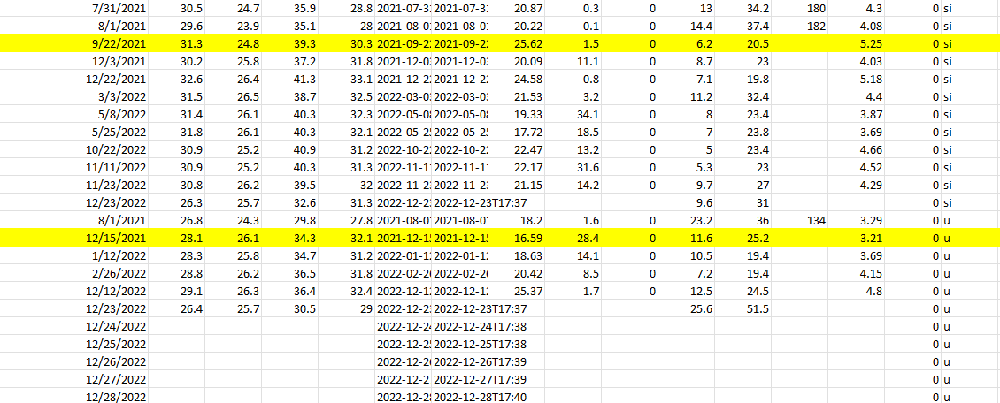

In [12]:
%matplotlib inline
from IPython.display import Image
Image('D:\Semester 6\Data Panel\Tugas Akhir\markdown 1.png')

If we look at the data set, it will be seen that valid and sequential data is from 1 January 2018 - 1 August 2021

In [13]:
start_date = '2018-01-01'
end_date = '2021-08-01'
# Select DataFrame rows between two dates
mask = (train['time'] >= start_date) & (train['time'] <= end_date)
train2 = train.loc[mask]

In [14]:
train2['city'].value_counts()

su    1309
si    1309
u     1309
le    1309
p     1309
lh    1309
b     1309
t     1309
sa    1309
q     1309
Name: city, dtype: int64

In [15]:
# make datetime features
columns_datetime = ['time', 'sunrise', 'sunset']
for column in columns_datetime:
  train2[column] = pd.to_datetime(train2[column])
# handle datetime features
train2['daylight_dur'] = train2.apply(lambda daylight: (daylight['sunset']-daylight['sunrise']).total_seconds()/60, axis = 1)
train2.set_index(train2.time, inplace = True)
train2.drop(columns_datetime, axis = 1, inplace = True)

## Test

In [16]:
test.head()

,id,time,temperature_2m_max (°C),temperature_2m_min (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),sunrise (iso8601),sunset (iso8601),shortwave_radiation_sum (MJ/m²),snowfall_sum (cm),windspeed_10m_max (km/h),windgusts_10m_max (km/h),winddirection_10m_dominant (°),et0_fao_evapotranspiration (mm),elevation,city
0,0,2021-08-02,32.3,25.3,38.2,29.6,2021-08-02T05:39,2021-08-02T17:30,20.79,0.0,7.6,16.9,134.0,4.45,0,su
1,1,2021-08-03,31.7,25.5,37.4,30.3,2021-08-03T05:39,2021-08-03T17:30,20.01,0.0,10.2,21.6,131.0,4.32,0,su
2,2,2021-08-04,32.6,25.7,37.1,30.8,2021-08-04T05:39,2021-08-04T17:30,20.89,0.0,17.3,32.4,116.0,4.73,0,su
3,3,2021-08-05,32.0,25.7,36.8,31.1,2021-08-05T05:39,2021-08-05T17:30,22.19,0.0,15.8,29.2,115.0,4.96,0,su
4,4,2021-08-06,31.9,26.3,36.0,31.6,2021-08-06T05:38,2021-08-06T17:30,21.84,0.0,20.2,36.7,106.0,4.99,0,su


In [17]:
test.isnull().sum()

id                                 0
time                               0
temperature_2m_max (°C)            0
temperature_2m_min (°C)            0
apparent_temperature_max (°C)      0
apparent_temperature_min (°C)      0
sunrise (iso8601)                  0
sunset (iso8601)                   0
shortwave_radiation_sum (MJ/m²)    0
snowfall_sum (cm)                  0
windspeed_10m_max (km/h)           0
windgusts_10m_max (km/h)           0
winddirection_10m_dominant (°)     0
et0_fao_evapotranspiration (mm)    0
elevation                          0
city                               0
dtype: int64

In [18]:
test.rename(
    columns = {
        'temperature_2m_max (°C)':'temp_max',
        'temperature_2m_min (°C)':'temp_min',
        'apparent_temperature_max (°C)':'app_temp_max',
        'apparent_temperature_min (°C)':'app_temp_min',
        'sunrise (iso8601)':'sunrise',
        'sunset (iso8601)':'sunset',
        'shortwave_radiation_sum (MJ/m²)':'srs',
        'snowfall_sum (cm)':'snowfall_sum',
        'windspeed_10m_max (km/h)':'ws_10m_max',
        'windgusts_10m_max (km/h)':'wg_10m_max',
        'winddirection_10m_dominant (°)':'wd_10m_dom',
        'et0_fao_evapotranspiration (mm)':'et0'
    }, inplace = True
)

In [19]:
for column in columns_datetime:
    test[column] = pd.to_datetime(test[column])
# handle datetime features
test['daylight_dur'] = test.apply(lambda daylight: (daylight['sunset'] - daylight['sunrise']).total_seconds()/60, axis = 1)
test.set_index(test.time, inplace = True)
test.drop(columns_datetime, axis = 1, inplace = True)

In [20]:
test.head()

,id,temp_max,temp_min,app_temp_max,app_temp_min,srs,snowfall_sum,ws_10m_max,wg_10m_max,wd_10m_dom,et0,elevation,city,daylight_dur
time,,,,,,,,,,,,,,
2021-08-02,0,32.3,25.3,38.2,29.6,20.79,0.0,7.6,16.9,134.0,4.45,0,su,711.0
2021-08-03,1,31.7,25.5,37.4,30.3,20.01,0.0,10.2,21.6,131.0,4.32,0,su,711.0
2021-08-04,2,32.6,25.7,37.1,30.8,20.89,0.0,17.3,32.4,116.0,4.73,0,su,711.0
2021-08-05,3,32.0,25.7,36.8,31.1,22.19,0.0,15.8,29.2,115.0,4.96,0,su,711.0
2021-08-06,4,31.9,26.3,36.0,31.6,21.84,0.0,20.2,36.7,106.0,4.99,0,su,712.0


# EDA

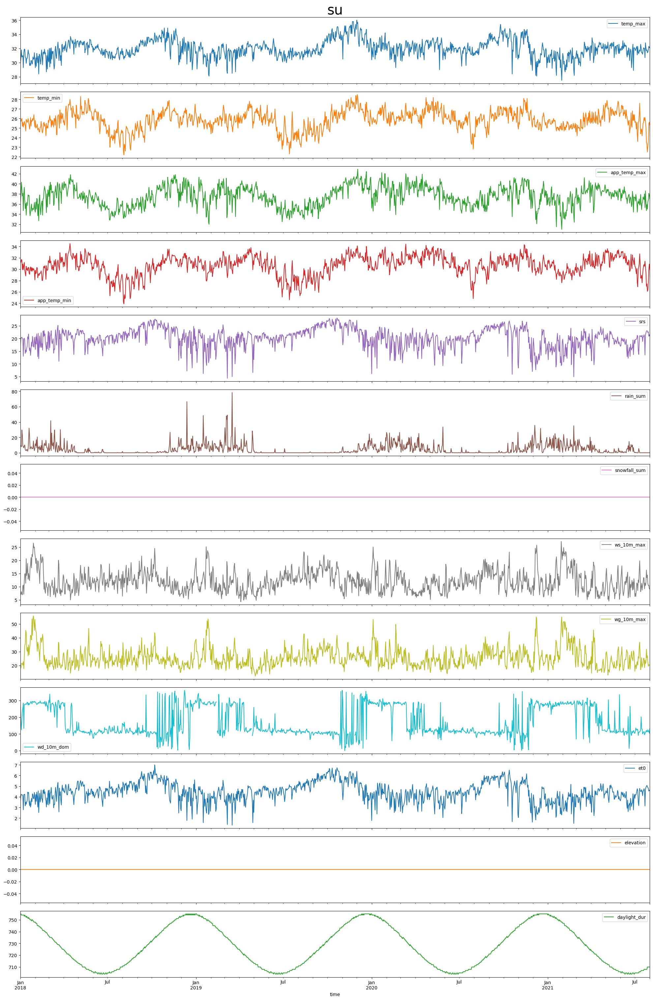

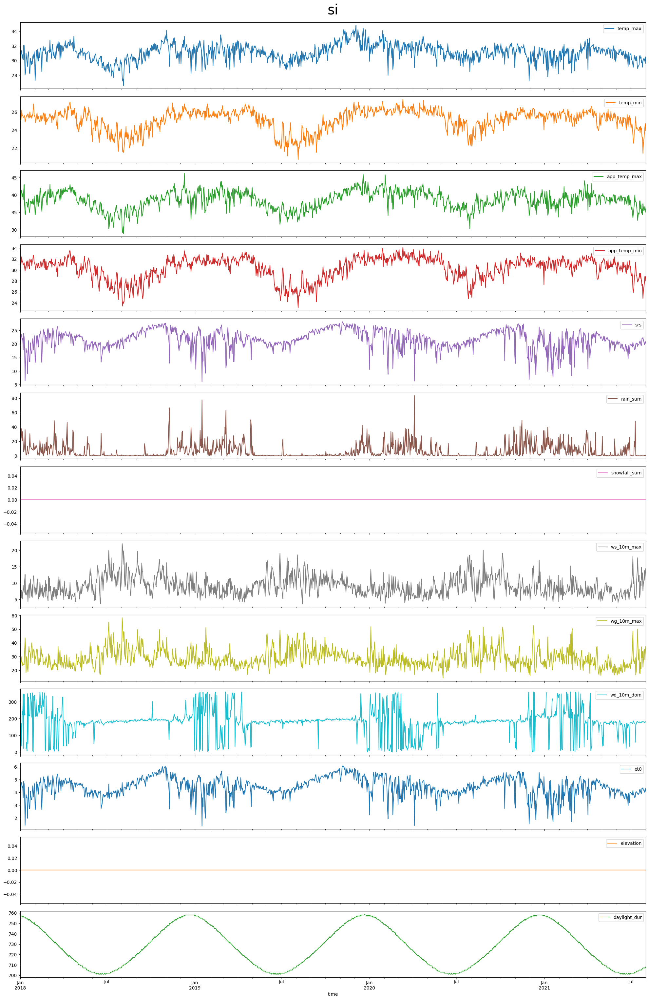

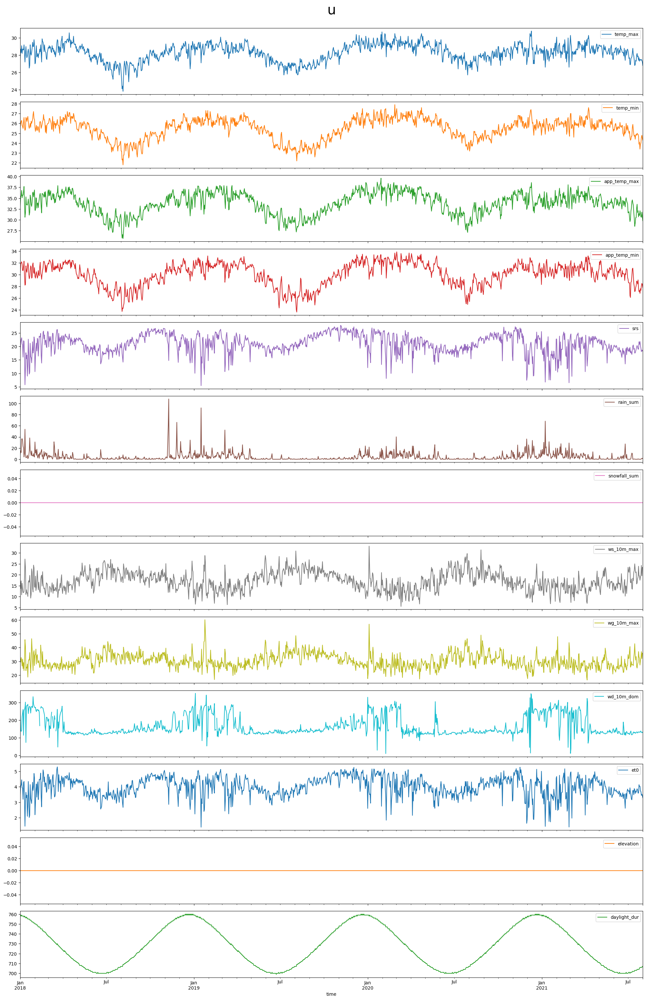

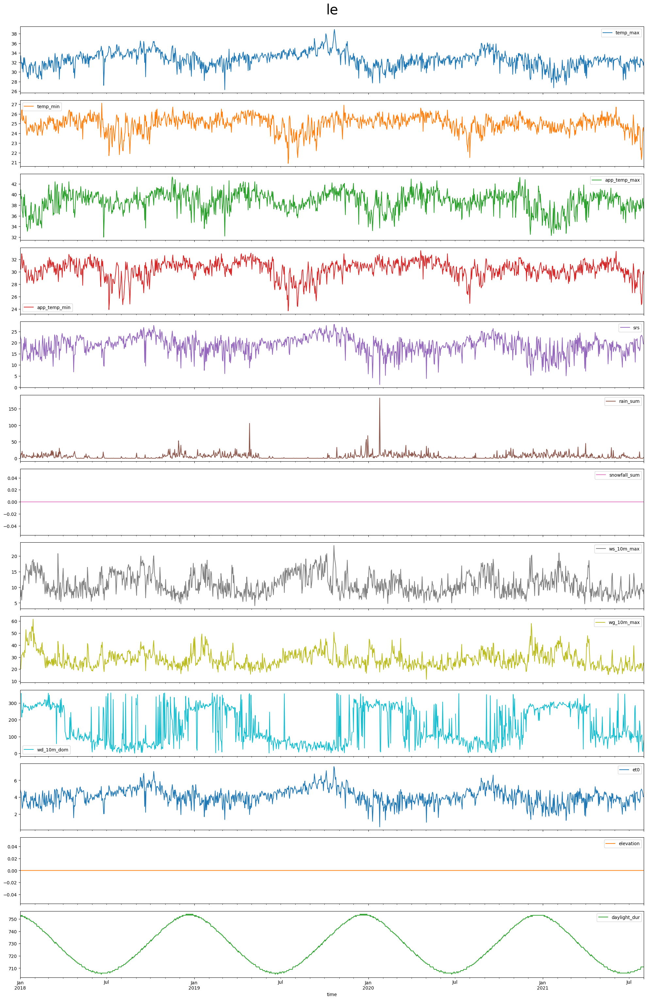

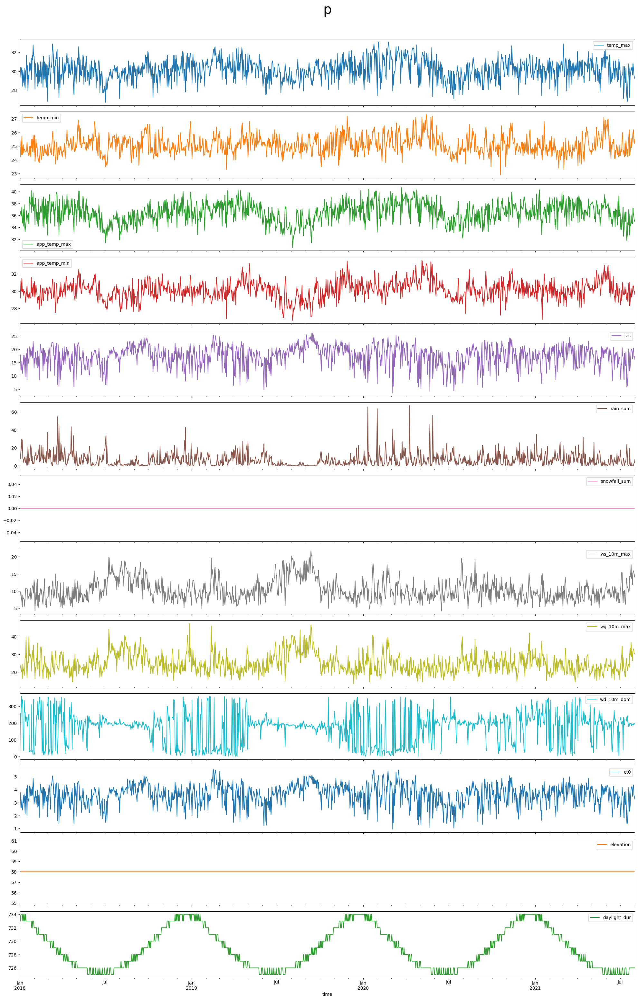

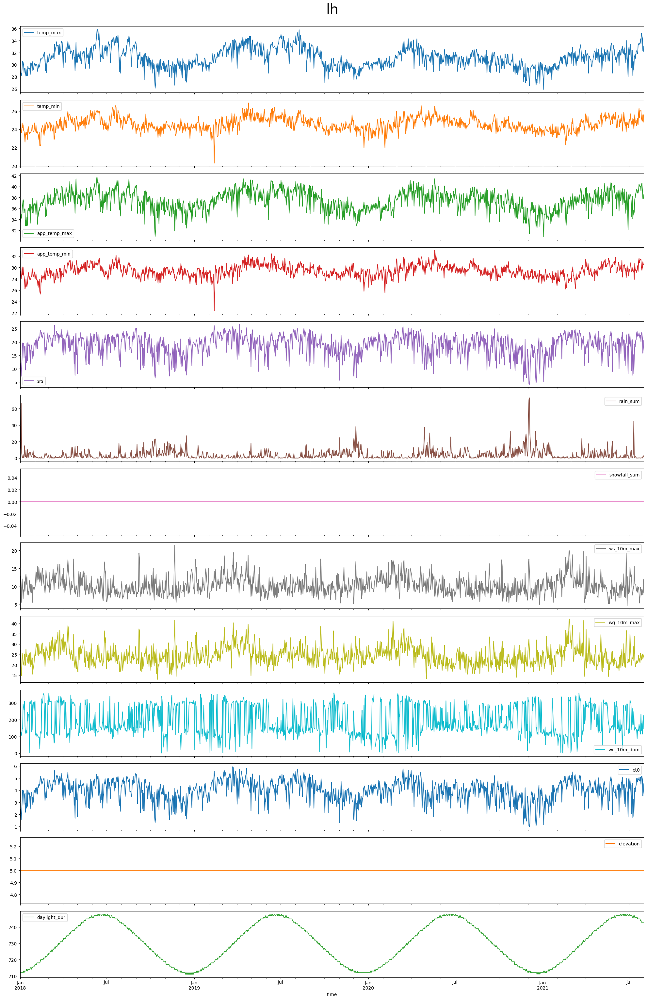

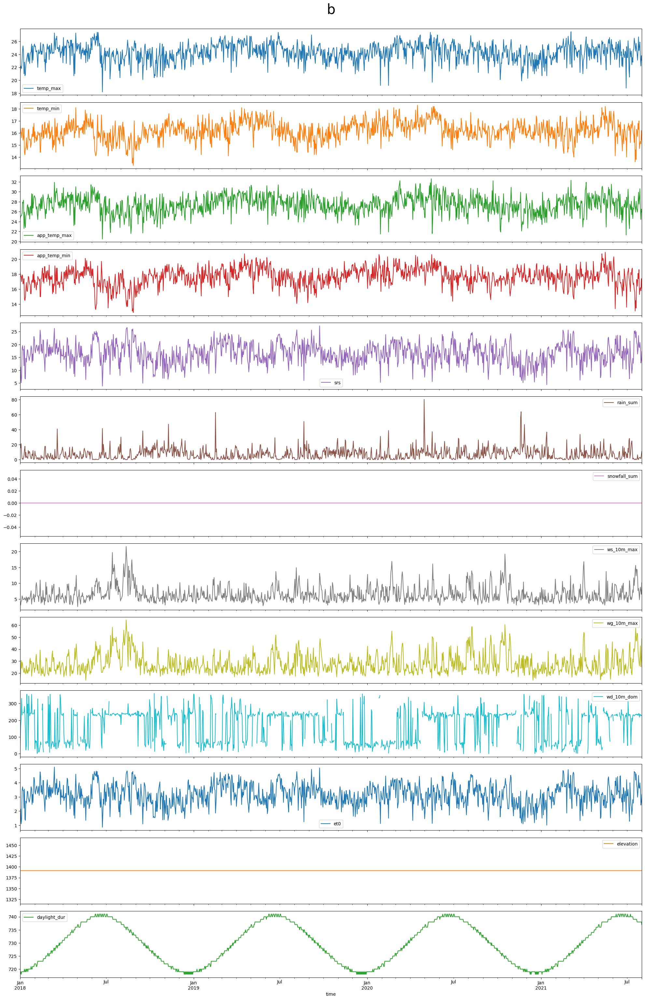

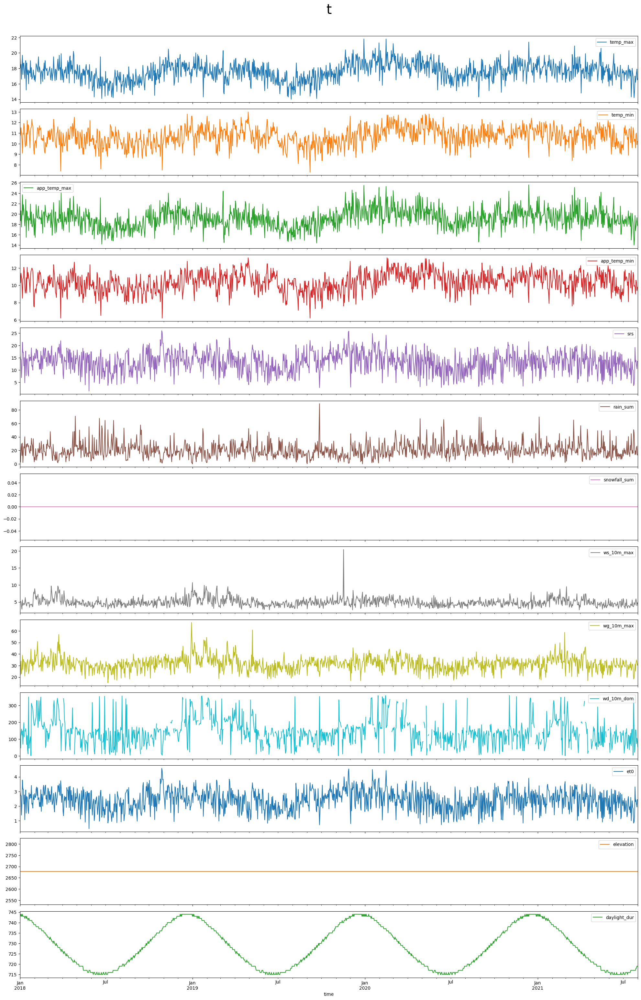

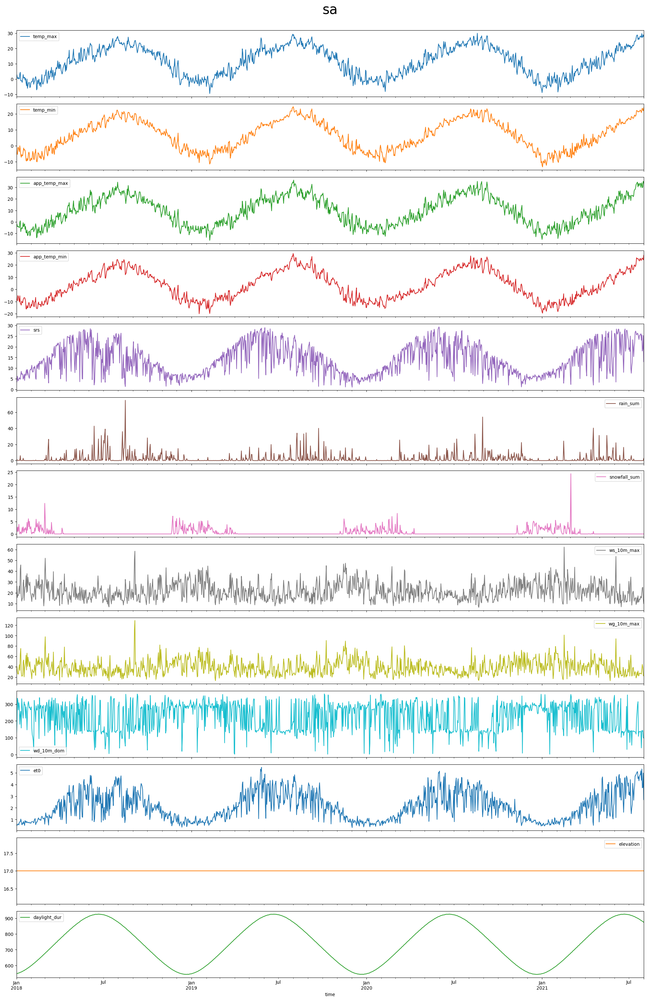

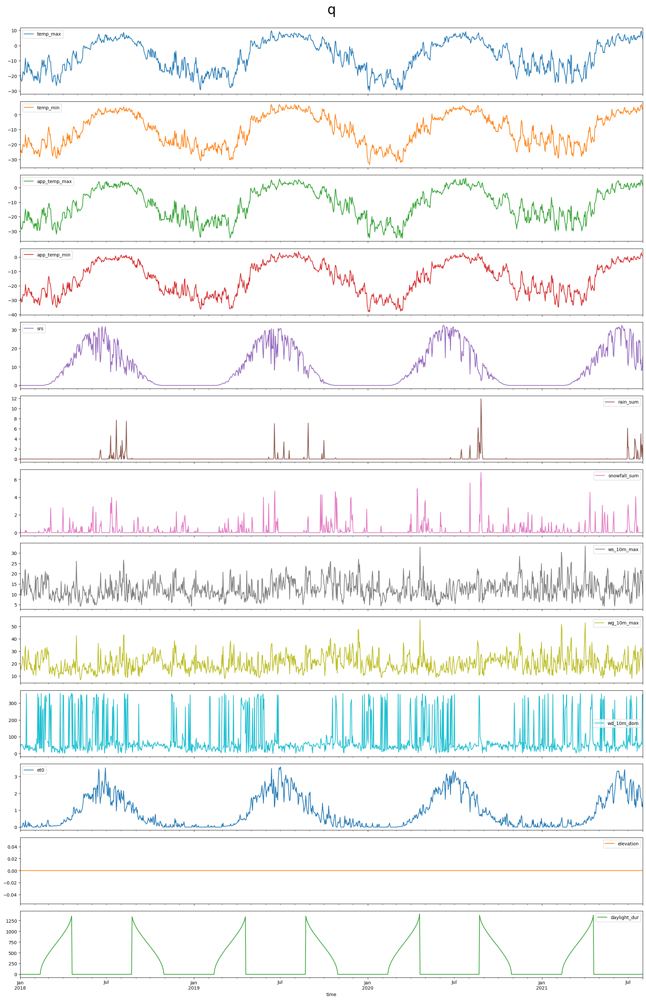

In [21]:
##### Make Plot Each City ###################
city_list = train2['city'].unique()
city_list = city_list.tolist()
for i in range(0,len(city_list)):
    train2.loc[train2['city']==city_list[i]].plot(subplots=True,figsize=(20, 30))
    plt.tight_layout()
    plt.title(city_list[i],y=14.5,fontsize=30)

# Missing Value Imputation

In [22]:
train2.isnull().sum()

temp_max          0
temp_min          0
app_temp_max      0
app_temp_min      0
srs               0
rain_sum          0
snowfall_sum      0
ws_10m_max        0
wg_10m_max        0
wd_10m_dom      298
et0               0
elevation         0
city              0
daylight_dur      0
dtype: int64

In [23]:
train2['time'] = train2.index

In [24]:
btrain=train2[train2['city']=="b"]
ttrain=train2[train2['city']=="t"]
ptrain=train2[train2["city"]=="p"]
sitrain=train2[train2["city"]=="si"]
letrain=train2[train2["city"]=="le"]
lhtrain=train2[train2["city"]=="lh"]
utrain=train2[train2["city"]=="u"]
sutrain=train2[train2["city"]=="su"]
satrain=train2[train2["city"]=="sa"]
qtrain=train2[train2["city"]=="q"]

In [25]:
btrain['wd_10m_dom']= btrain['wd_10m_dom'].interpolate(option='spline')
ttrain['wd_10m_dom']= ttrain['wd_10m_dom'].interpolate(option='spline')
ptrain['wd_10m_dom']= ptrain['wd_10m_dom'].interpolate(option='spline')
sitrain['wd_10m_dom']= sitrain['wd_10m_dom'].interpolate(option='spline')
letrain['wd_10m_dom']= letrain['wd_10m_dom'].interpolate(option='spline')
lhtrain['wd_10m_dom']= lhtrain['wd_10m_dom'].interpolate(option='spline')
utrain['wd_10m_dom']= utrain['wd_10m_dom'].interpolate(option='spline')
sutrain['wd_10m_dom']= sutrain['wd_10m_dom'].interpolate(option='spline')
satrain['wd_10m_dom']= satrain['wd_10m_dom'].interpolate(option='spline')
qtrain['wd_10m_dom']= qtrain['wd_10m_dom'].interpolate(option='spline')

In [26]:
trainprep=pd.concat([btrain, ttrain, ptrain, sitrain, letrain, lhtrain, utrain, sutrain, satrain, qtrain], ignore_index=True)

# ADF Test

In [27]:
######################### ADF TEST EACH CITY EACH COLUMN ########################
col_train = trainprep.columns
col_train = col_train.to_list()
col_train.remove('city')
for i in range(0,len(city_list)):
    data=pd.DataFrame()
    data = trainprep.loc[trainprep['city']==city_list[i]]
    print("===============================================================")
    print("City : ",city_list[i])
    print("==============================================================")
    for i in range(0,len(col_train)):
        X=data[col_train[i]].values
        result = adfuller(X)
        print("===============================")
        print("Column : ",col_train[i])
        print('ADF Statistic: %f' % result[0])
        print('p-value: %f' % result[1])
        print('Critical Values:')
        for key, value in result[4].items():
            print('\t%s: %.3f' % (key, value))
        print("===============================")

City :  su
Column :  temp_max
ADF Statistic: -3.936147
p-value: 0.001784
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  temp_min
ADF Statistic: -3.798720
p-value: 0.002920
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  app_temp_max
ADF Statistic: -4.226636
p-value: 0.000594
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  app_temp_min
ADF Statistic: -3.101177
p-value: 0.026466
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  srs
ADF Statistic: -4.681746
p-value: 0.000091
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  rain_sum
ADF Statistic: -3.915238
p-value: 0.001926
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  snowfall_sum
ADF Statistic: nan
p-value: nan
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  ws_10m_max
ADF Statistic: -7.011989
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568
Column :  wg_10m_max
ADF Statistic: -7.222162
p-value: 0.000000

# Export File 

In [28]:
trainprep

,temp_max,temp_min,app_temp_max,app_temp_min,srs,rain_sum,snowfall_sum,ws_10m_max,wg_10m_max,wd_10m_dom,et0,elevation,city,daylight_dur,time
0,21.1,16.5,24.5,18.3,5.15,22.0,0.0,3.6,15.1,25.0,1.12,1391,b,718.0,2018-01-01
1,22.2,16.1,25.0,17.7,11.23,15.7,0.0,3.1,19.8,166.0,2.14,1391,b,719.0,2018-01-02
2,22.0,16.0,25.2,17.7,5.14,21.2,0.0,4.3,30.6,203.0,1.10,1391,b,718.0,2018-01-03
3,21.8,15.6,25.2,17.0,6.80,9.1,0.0,4.4,24.1,331.0,1.38,1391,b,719.0,2018-01-04
4,23.3,16.4,25.7,17.9,18.50,0.7,0.0,6.0,29.2,232.0,3.46,1391,b,719.0,2018-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13085,9.3,5.4,5.1,1.8,13.87,5.0,0.0,20.2,30.2,54.0,1.74,0,q,0.0,2021-07-28
13086,9.5,6.9,5.2,3.0,8.00,0.4,0.0,21.8,32.8,67.0,1.66,0,q,0.0,2021-07-29
13087,6.8,5.0,3.0,1.1,8.14,2.8,0.0,16.1,25.6,54.0,1.26,0,q,0.0,2021-07-30
13088,6.0,3.7,2.9,0.7,9.30,2.1,0.0,16.1,21.2,352.0,1.20,0,q,0.0,2021-07-31


In [29]:
trainprep.to_csv('data preprocessed.csv',index=False)

# Check

In [30]:
prepocessed = pd.read_csv('D:\Semester 6\Data Panel\Tugas Akhir\data preprocessed.csv')
prepocessed.head()

,temp_max,temp_min,app_temp_max,app_temp_min,srs,rain_sum,snowfall_sum,ws_10m_max,wg_10m_max,wd_10m_dom,et0,elevation,city,daylight_dur,time
0,21.1,16.5,24.5,18.3,5.15,22.0,0.0,3.6,15.1,25.0,1.12,1391,b,718.0,2018-01-01
1,22.2,16.1,25.0,17.7,11.23,15.7,0.0,3.1,19.8,166.0,2.14,1391,b,719.0,2018-01-02
2,22.0,16.0,25.2,17.7,5.14,21.2,0.0,4.3,30.6,203.0,1.10,1391,b,718.0,2018-01-03
3,21.8,15.6,25.2,17.0,6.80,9.1,0.0,4.4,24.1,331.0,1.38,1391,b,719.0,2018-01-04
4,23.3,16.4,25.7,17.9,18.50,0.7,0.0,6.0,29.2,232.0,3.46,1391,b,719.0,2018-01-05
